# 🧠 BRAIN TUMOR DETECTION MODEL USING YOLOv11 🦠

📦 Importing Required Libraries

In [1]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from ultralytics import YOLO
import cv2
import numpy as np
import random
import json

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.


⚙️ Configuration and Hyperparameters

In [11]:
EPOCHS = 500
IMG_SIZE = 640
BATCH_SIZE = 32
CONF_THRESHOLD = 0.5
IOU_THRESHOLD = 0.45

Project_Name = 'Brain Tumor Detection'
RUN_NAME = 'YOLO12_'

TRAIN_PROJECT_NAME = Project_Name
TRAIN_RUN_NAME = 'train_'+RUN_NAME

PREDICT_PROJECT_NAME = Project_Name
PREDICT_RUN_NAME = 'prediction_'+RUN_NAME

num_images_to_predict = 10

DATASET_PATH = 'dataset'
# DATASET_PATH = ''
YAML_FILE = DATASET_PATH + '/data.yaml'

## 🏋️ Training

🤖 Defining Model 📦

In [3]:
model = YOLO("yolov12n.pt", task='detect')

🧑‍🏫 Train the Model 🏃‍♂️

In [4]:
results = model.train(
    data=YAML_FILE,
    epochs=EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    project=TRAIN_PROJECT_NAME,
    name=TRAIN_RUN_NAME,
    amp=True,
    patience=16,
    pretrained=True,
    optimizer='auto'
)

print("Training finished. Model saved to:", model.trainer.save_dir)

BEST_MODEL_PATH = os.path.join(model.trainer.save_dir, 'weights', 'best.pt')
print("Best model weights path:", BEST_MODEL_PATH)

New https://pypi.org/project/ultralytics/8.3.169 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
engine/trainer: task=detect, mode=train, model=yolov12n.pt, data=dataset/data.yaml, epochs=500, time=None, patience=16, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Brain Tumor Detection, name=train_YOLO12_2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

train: Scanning /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/train/labels.cache... 2144 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2144/2144 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2143, len(boxes) = 2144. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/.conda/lib/python3.11/site-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/valid/labels.cache... 612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 612/612 [00:00<?, ?it/s]


Plotting labels to Brain Tumor Detection/train_YOLO12_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Brain Tumor Detection/train_YOLO12_2
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      7.41G      1.271      4.101      1.407         46        640: 100%|██████████| 67/67 [00:28<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]

                   all        612        612    0.00264      0.812      0.242      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      7.29G      1.217      2.756      1.311         59        640: 100%|██████████| 67/67 [00:27<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]


                   all        612        612     0.0713      0.162     0.0375     0.0217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      7.35G      1.239      2.204      1.298         62        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]


                   all        612        612      0.349      0.295      0.201      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500      7.29G      1.324      1.986      1.355         53        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]


                   all        612        612      0.244      0.122      0.101     0.0606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      7.35G       1.32      1.765      1.389         64        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]


                   all        612        612      0.748      0.234       0.27      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500      7.29G      1.271      1.572      1.352         58        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]


                   all        612        612      0.396      0.411      0.352      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      7.35G      1.275      1.493      1.361         55        640: 100%|██████████| 67/67 [00:27<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.51it/s]


                   all        612        612      0.575      0.443      0.448      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      7.29G      1.221      1.374      1.327         60        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.47it/s]

                   all        612        612       0.62      0.665      0.684      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      7.34G      1.241      1.363      1.342         47        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.56it/s]

                   all        612        612       0.66      0.597      0.627      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      7.29G       1.21      1.326      1.342         49        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.475      0.487      0.463      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      7.34G      1.209      1.285      1.335         60        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        612        612      0.687       0.67      0.702      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      7.29G       1.19      1.241      1.332         44        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.55it/s]

                   all        612        612      0.797      0.678      0.758      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      7.34G      1.187      1.247      1.323         60        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.56it/s]

                   all        612        612      0.724      0.732      0.778      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      7.29G      1.168      1.162      1.311         51        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        612        612      0.576      0.516      0.509      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      7.34G       1.16      1.125      1.302         45        640: 100%|██████████| 67/67 [00:27<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        612        612      0.771      0.694      0.749      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      7.29G      1.128      1.136      1.289         46        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.58it/s]

                   all        612        612      0.719      0.608      0.677      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      7.34G       1.12      1.075      1.282         56        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        612        612       0.75      0.754      0.789      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/500      7.29G      1.141      1.077      1.281         49        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.752      0.605      0.679       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      7.34G      1.109      1.081      1.268         49        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.802      0.763      0.834      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      7.29G       1.12      1.083      1.279         48        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.702      0.677      0.729      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      7.34G      1.097      1.054      1.262         51        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.58it/s]

                   all        612        612       0.78      0.735      0.793       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      7.29G      1.082      1.015      1.254         59        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.54it/s]


                   all        612        612      0.808      0.727      0.823      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      7.34G      1.077     0.9904      1.251         39        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]

                   all        612        612       0.65      0.567       0.58        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      7.29G      1.087     0.9833      1.255         53        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]

                   all        612        612      0.759      0.753      0.805       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      7.34G      1.086     0.9598      1.248         52        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.746      0.711      0.774       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      7.29G      1.085      1.003      1.261         53        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        612        612      0.755      0.727      0.783      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      7.34G      1.072     0.9547      1.244         49        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        612        612      0.855      0.814      0.875      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      7.29G      1.079     0.9736      1.256         66        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.58it/s]

                   all        612        612      0.799      0.771      0.827      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      7.34G      1.063     0.9292       1.24         47        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]

                   all        612        612      0.854      0.777      0.845      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      7.29G      1.072     0.9595      1.242         51        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        612        612      0.848      0.796       0.86      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      7.34G      1.024     0.9018       1.22         56        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        612        612      0.829       0.74      0.814      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      7.29G      1.036     0.8753      1.239         56        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.56it/s]

                   all        612        612      0.857      0.798      0.862      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      7.34G      1.036      0.889      1.221         47        640: 100%|██████████| 67/67 [00:24<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.90it/s]

                   all        612        612      0.842      0.791      0.858      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      7.29G      1.047     0.8754      1.231         45        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]

                   all        612        612      0.781      0.647      0.724      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      7.34G      1.038     0.8787      1.214         53        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.91it/s]

                   all        612        612      0.825      0.694      0.756      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      7.29G      1.022     0.8727      1.215         53        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.91it/s]

                   all        612        612      0.825       0.76      0.819      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      7.34G      1.021      0.883      1.209         47        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.89it/s]

                   all        612        612       0.79      0.709       0.79      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      7.29G      1.019      0.873       1.21         46        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.89it/s]

                   all        612        612      0.849       0.74      0.821      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      7.34G      1.037     0.8868      1.227         53        640: 100%|██████████| 67/67 [00:24<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.91it/s]

                   all        612        612      0.843      0.805      0.862      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      7.29G      1.002     0.8301      1.198         58        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.85it/s]

                   all        612        612      0.815      0.755       0.82      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      7.34G      1.018     0.8509      1.215         46        640: 100%|██████████| 67/67 [00:24<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.93it/s]

                   all        612        612      0.718       0.76      0.794      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      7.29G       1.01     0.8316      1.197         50        640: 100%|██████████| 67/67 [00:24<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.97it/s]

                   all        612        612      0.757      0.455      0.573      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      7.34G     0.9942     0.8111      1.195         52        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        612        612      0.807      0.784      0.849      0.609
EarlyStopping: Training stopped early as no improvement observed in last 16 epochs. Best results observed at epoch 27, best model saved as best.pt.
To update EarlyStopping(patience=16) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



43 epochs completed in 0.353 hours.
Optimizer stripped from Brain Tumor Detection/train_YOLO12_2/weights/last.pt, 5.4MB
Optimizer stripped from Brain Tumor Detection/train_YOLO12_2/weights/best.pt, 5.4MB

Validating Brain Tumor Detection/train_YOLO12_2/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
YOLOv12n summary (fused): 376 layers, 2,508,929 parameters, 0 gradients, 5.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]


                   all        612        612      0.855      0.814      0.874       0.63
                glioma        285        285      0.746      0.639      0.727      0.433
            meningioma        142        142      0.888      0.915      0.952      0.765
             pituitary        185        185      0.931      0.886      0.945      0.693
Speed: 0.1ms preprocess, 2.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to Brain Tumor Detection/train_YOLO12_2
Training finished. Model saved to: Brain Tumor Detection/train_YOLO12_2
Best model weights path: Brain Tumor Detection/train_YOLO12_2/weights/best.pt


## Testing

🔍 Setting Up for Predictions and Visualization

In [4]:
BEST_MODEL_PATH = "Brain Tumor Detection/train_YOLO12_2/weights/best.pt"
trained_model = YOLO(BEST_MODEL_PATH)

TEST_IMAGES_DIR = os.path.join(DATASET_PATH, 'test', 'images')
TEST_LABELS_DIR = os.path.join(DATASET_PATH, 'test', 'labels')

test_image_files = glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpeg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.png'))
random.shuffle(test_image_files)

num_images_to_predict = 25
if num_images_to_predict > 0:                   
    test_image_files = test_image_files[:num_images_to_predict]

🏷️ Loading Class Names

In [5]:
def load_class_names(yaml_path):
    import yaml
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    return data['names']

class_names = load_class_names(YAML_FILE)

🖍️ Helper Function to Draw Annotations

In [8]:
import matplotlib.font_manager as fm
import json
import cv2
from PIL import Image, ImageDraw, ImageFont # Import Pillow components
import numpy as np # For converting Pillow Image back to OpenCV format

anote = {}
try:
    with open('./dataset/class-list.json', 'r', encoding='utf-8') as file: # Ensure UTF-8 encoding for JSON
        anote = json.load(file)
except FileNotFoundError:
    print("Error: ./dataset/class-list.json not found. Make sure the file is in the correct path.")
    # Fallback or exit if essential data is missing
    anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except json.JSONDecodeError:
    print("Error: Could not decode JSON from ./dataset/class-list.json. The file might be corrupted or not valid JSON.")
    anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data

# --- Font Loading for PIL ---
# Make sure NotoSansBengali-Light.ttf is in your 'fonts' directory
font_path = './fonts/NotoSansBengali-Light.ttf'
try:
    # Load font for Pillow. You might need to adjust the font size.
    # A size around 16-24 usually works well, depending on image resolution.
    font_size = 21
    pil_font = ImageFont.truetype(font_path, font_size)
    prop = fm.FontProperties(fname=font_path, size=font_size)
    print(f"Successfully loaded font: {font_path}")
except IOError:
    print(f"Error: Could not load font from {font_path}. Make sure the path is correct and the font file exists.")
    # Fallback to a generic font if the specified one isn't found
    pil_font = ImageFont.load_default() # This won't render Bangla correctly
    print("Falling back to default font. Bengali text may not display correctly.")


def draw_annotations(image, annotations, class_names, is_gt=False, title_text=None, number_plate=None):
    # Convert OpenCV BGR image to PIL RGB image
    # Pillow expects RGB, OpenCV uses BGR
    pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    draw = ImageDraw.Draw(pil_image)

    img_height, img_width, _ = image.shape

    # Define a color palette for different classes (RGB for Pillow)
    color_palette_rgb = [
        (255, 0, 0),    # Red
        (0, 255, 0),    # Green
        (0, 0, 255),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
        (128, 0, 0),    # Dark Red
        (0, 128, 0),    # Dark Green
        (0, 0, 128),    # Dark Blue
        (128, 128, 0),  # Olive
        (128, 0, 128),  # Purple
        (0, 128, 128),  # Teal
    ]

    # Text colors that contrast well with the highlight colors (RGB)
    text_color_palette_rgb = [
        (255, 255, 255), # White for Red background
        (0, 0, 0),       # Black for Green background
        (255, 255, 255), # White for Blue background
        (0, 0, 0),       # Black for Yellow background
        (255, 255, 255), # White for Magenta background
        (0, 0, 0),       # Black for Cyan background
        (255, 255, 255), # White for Dark Red background
        (255, 255, 255), # White for Dark Green background
        (255, 255, 255), # White for Dark Blue background
        (255, 255, 255), # White for Olive background
        (255, 255, 255), # White for Purple background
        (255, 255, 255), # White for Teal background
    ]

    for ann in annotations:
        class_id = int(ann[0])
        
        # Determine color based on class_id
        color_idx = class_id % len(color_palette_rgb)
        border_color_rgb = color_palette_rgb[color_idx]
        text_color_rgb = text_color_palette_rgb[color_idx]

        if len(ann) >= 5: # Check if there are at least 5 elements (class_id + 4 coords)
            x_center, y_center, width, height = ann[1:5]
        else:
            print(f"Warning: Annotation {ann} does not have enough values for bounding box. Skipping.")
            continue

        x_min = int((x_center - width / 2) * img_width)
        y_min = int((y_center - height / 2) * img_height)
        x_max = int((x_center + width / 2) * img_width)
        y_max = int((y_center + height / 2) * img_height)

        # Draw bounding box using Pillow
        draw.rectangle([(x_min, y_min), (x_max, y_max)], outline=border_color_rgb, width=2)

        label_key = str(class_id)
        label_text = anote.get(label_key, f"Unknown Class {class_id}") # Use .get with a default fallback
        
        if not is_gt and len(ann) > 5:
            confidence = int(ann[5]*100)
            # You can uncomment this if you want confidence added in Bangla
            # label_text += f' {confidence}%' # Or f' {confidence}% আস্থা' if you prefer Bangla for "confidence"

        # Get text size using PIL font
        text_bbox = draw.textbbox((0, 0), label_text, font=pil_font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]

        # Draw background rectangle for text (highlight)
        # Pillow's rectangle works with (x0, y0, x1, y1)
        draw.rectangle([(x_min, y_min - text_height - 5), # Add some padding (5)
                        (x_min + text_width + 5, y_min)], # Add some padding (5)
                       fill=border_color_rgb)

        # Put text on top of the highlight
        draw.text((x_min + 2, y_min - text_height - 2), # Small offset for text
                  label_text, font=pil_font, fill=text_color_rgb)

    # Add a title if provided (in Bangla)
    if title_text:
        title_font = ImageFont.truetype(font_path, 34)
        title_bbox = draw.textbbox((0, 0), title_text, font=title_font)
        title_width = title_bbox[2] - title_bbox[0]
        title_height = title_bbox[3] - title_bbox[1]
        
        # Position title at the top center
        title_x = (img_width - title_width) / 2
        title_y = img_height - 40   # Some padding from the top
        
        # Define background color for the title (e.g., dark background)
        background_color = (0, 0, 0)  # Black background (you can change this)
        text_color = (255, 255, 255)  # White text color
        
        # Draw the background rectangle for the title
        draw.rectangle(
            [(title_x, title_y+4),  # Add some padding around the title
            (title_x + title_width +5, title_y + title_height + 8)],  # Padding
            fill=background_color
        )
        draw.text((title_x, title_y), title_text, font=title_font, fill=text_color)

    # Convert PIL Image back to OpenCV BGR format
    display_image_bgr = cv2.cvtColor(np.array(pil_image), cv2.COLOR_RGB2BGR)
    return display_image_bgr

Successfully loaded font: ./fonts/NotoSansBengali-Light.ttf


🖼️ Predict and Visualize Each Test Image


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1693_jpg.rf.e7ae5548c3ead44346a660bd91830004.jpg: 640x640 1 pituitary, 9.2ms
Speed: 8.3ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


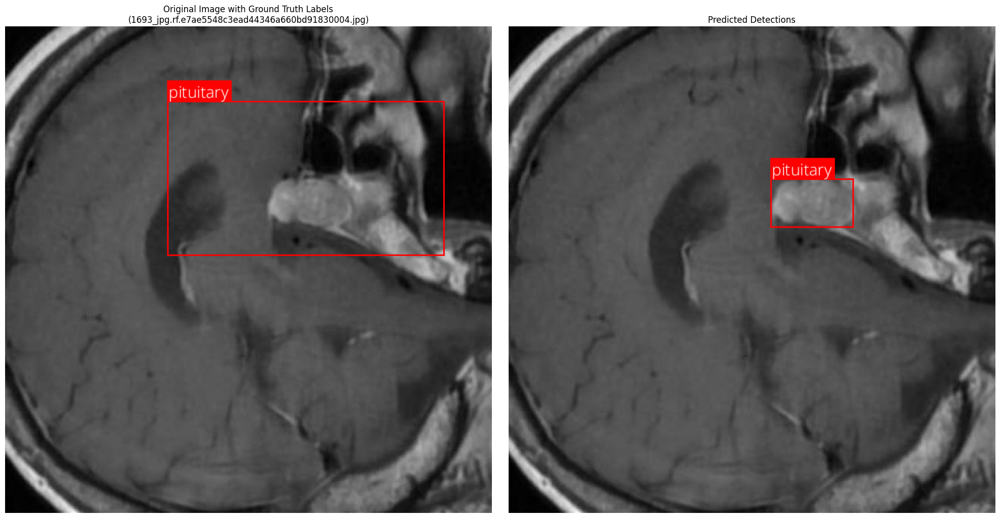


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2821_jpg.rf.af3a466c75bd89deb03e482ae65b22dc.jpg: 640x640 (no detections), 9.0ms
Speed: 1.1ms preprocess, 9.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


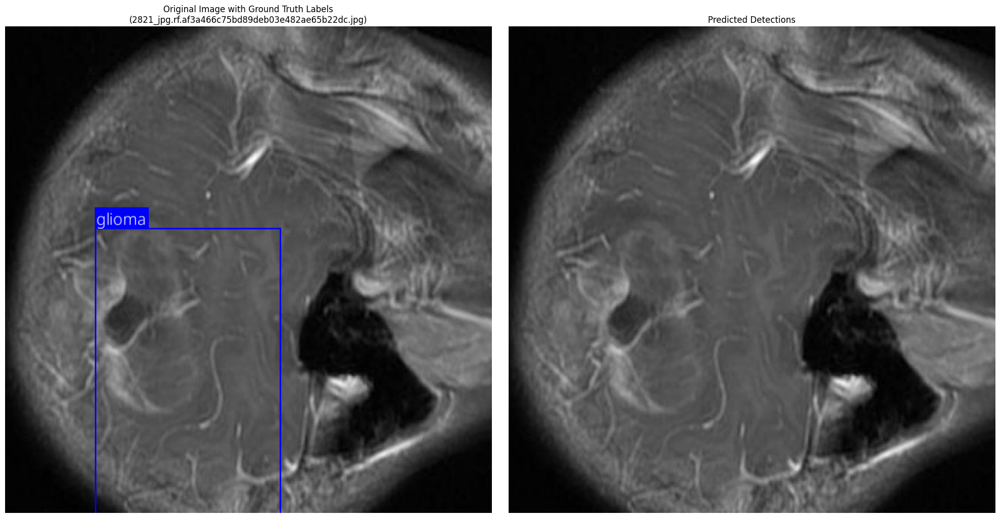


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1885_jpg.rf.fcf3a657b0b2fc6c2e9f9c48612f4d08.jpg: 640x640 1 glioma, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


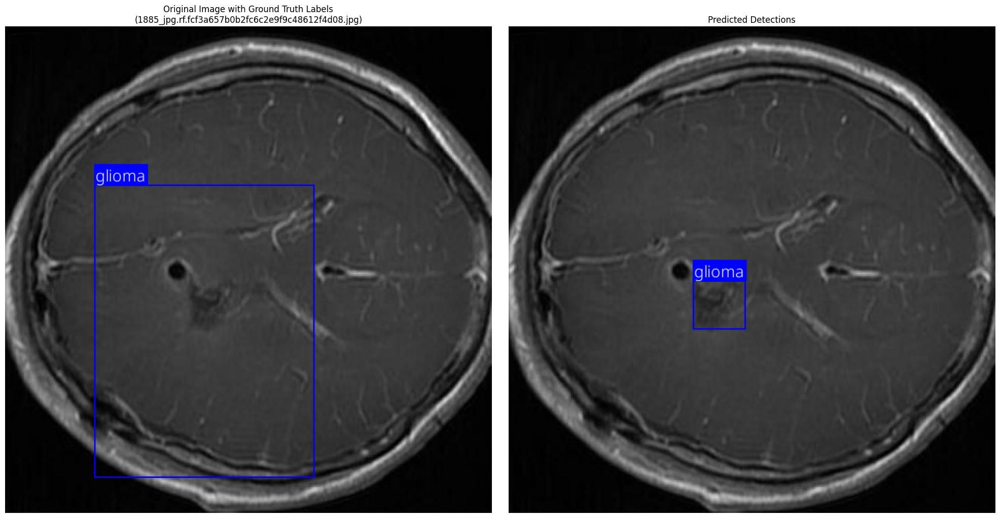


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/937_jpg.rf.f1aeff71adf047fc3774da3706a9c18d.jpg: 640x640 1 pituitary, 8.8ms
Speed: 1.1ms preprocess, 8.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


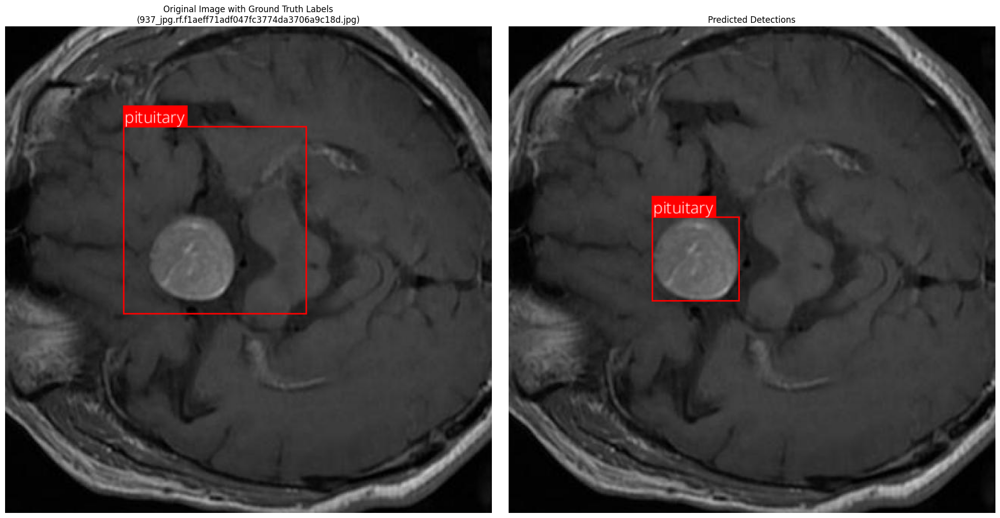


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2773_jpg.rf.8dd0009a9eedcd33eaa16dfdd1d7efaf.jpg: 640x640 1 glioma, 9.0ms
Speed: 1.1ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


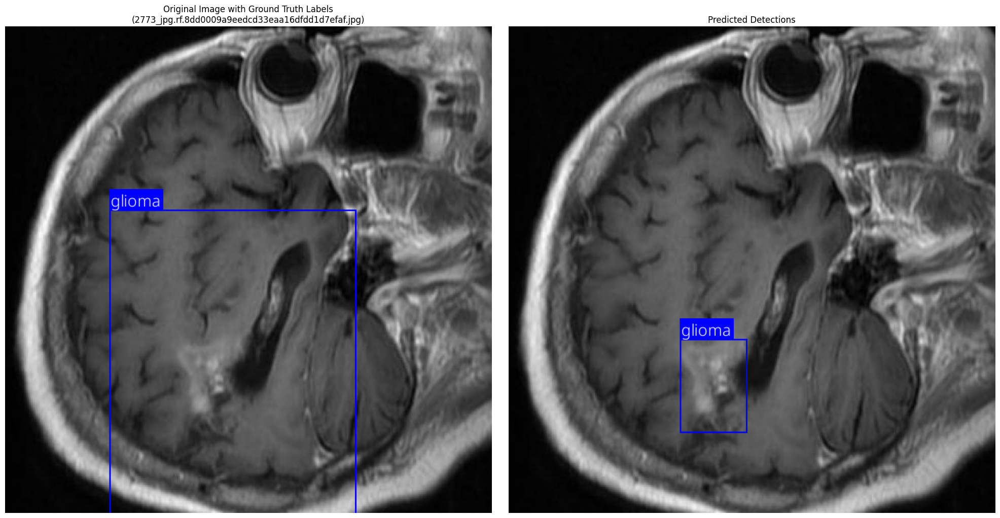


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2347_jpg.rf.3a9d113da7e0bcd3ea58a80a19254a1a.jpg: 640x640 1 glioma, 10.1ms
Speed: 1.1ms preprocess, 10.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


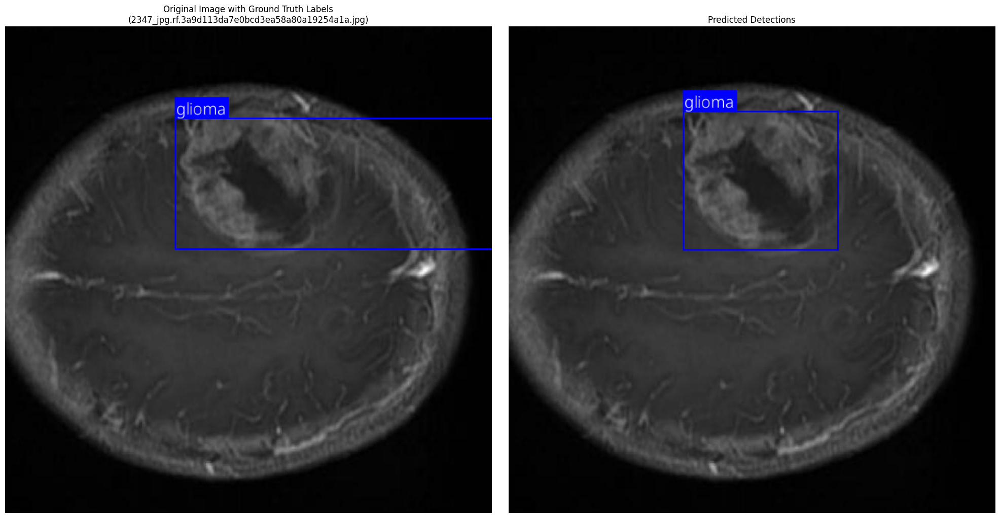


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/676_jpg.rf.95b480131f4317ee0cd620bf95c03a3c.jpg: 640x640 1 meningioma, 8.8ms
Speed: 1.1ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


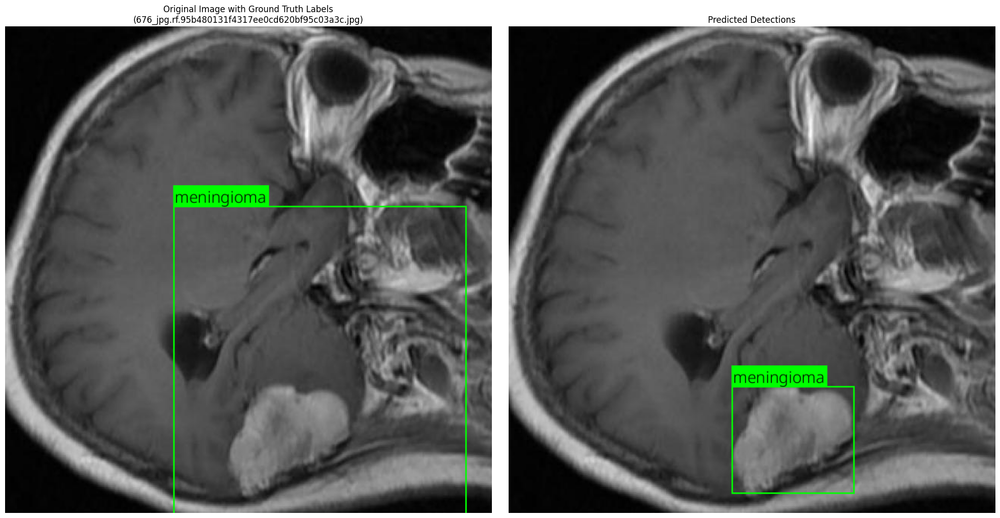


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2350_jpg.rf.97c970c1eaa99150a5ff681da63013ea.jpg: 640x640 3 gliomas, 9.2ms
Speed: 1.1ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


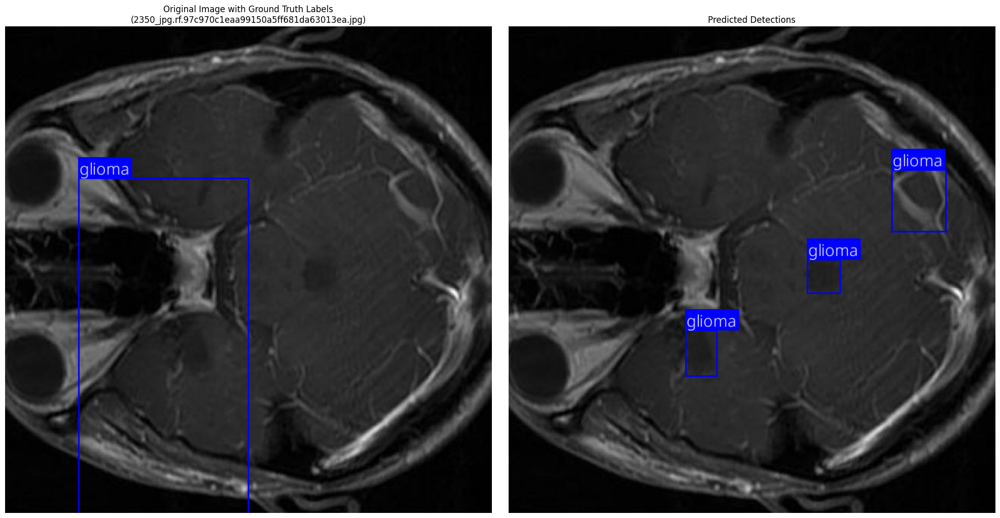


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/233_jpg.rf.f8e76a85f9415a5bb5b8bd9f6cd8c5be.jpg: 640x640 1 meningioma, 9.5ms
Speed: 1.0ms preprocess, 9.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


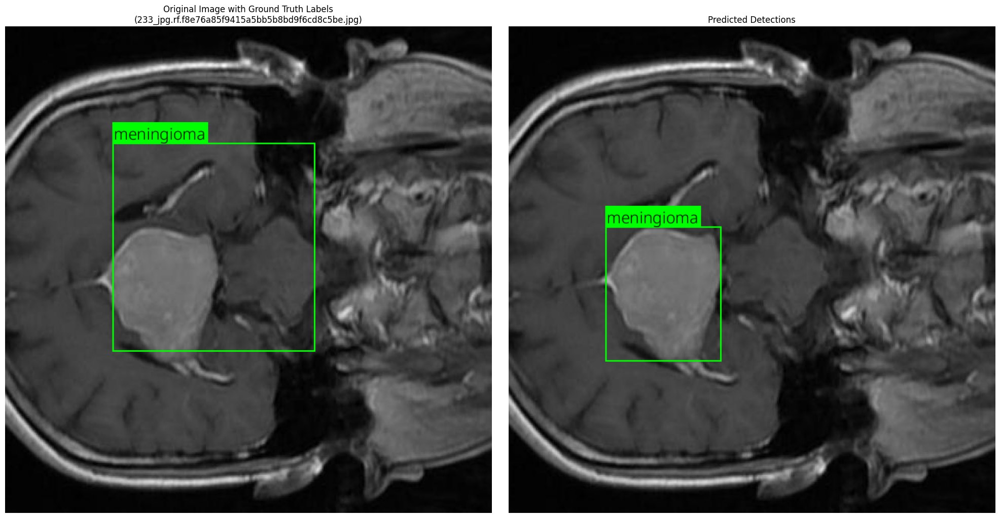


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1157_jpg.rf.034c9ffcd15fd9a89a3af651dabfeb67.jpg: 640x640 1 pituitary, 8.9ms
Speed: 1.1ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


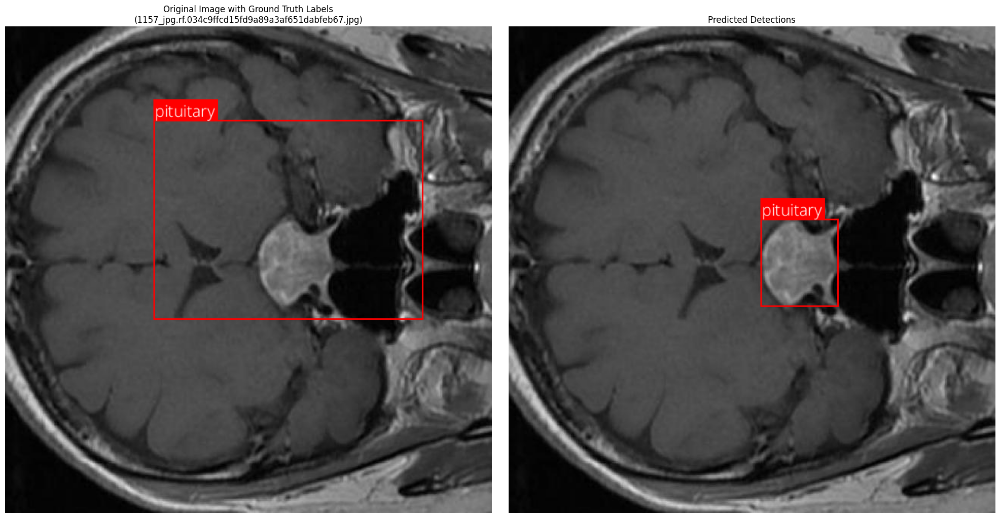


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1641_jpg.rf.c12f8171a7788b077463d75151a660bc.jpg: 640x640 1 pituitary, 12.0ms
Speed: 1.1ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


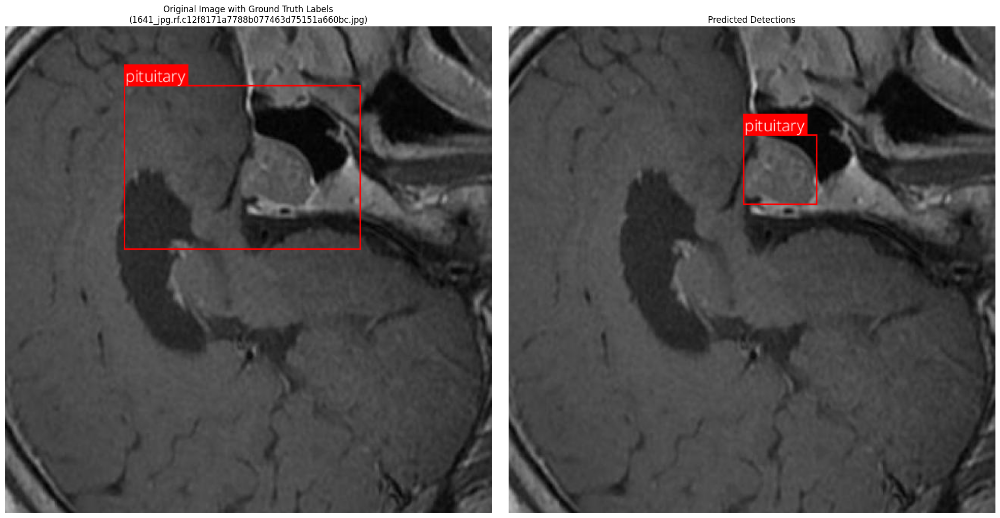


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/68_jpg.rf.41f015e4f5a5ef1b98a9039274441ad2.jpg: 640x640 1 meningioma, 8.8ms
Speed: 1.1ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


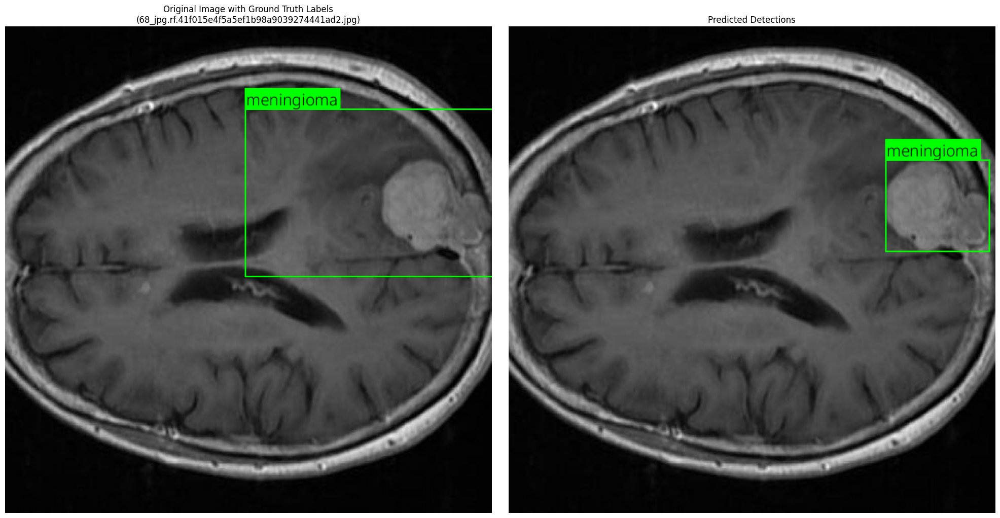


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/716_jpg.rf.dfd526c73892008fd330c8a80aaa39db.jpg: 640x640 1 glioma, 9.5ms
Speed: 1.1ms preprocess, 9.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


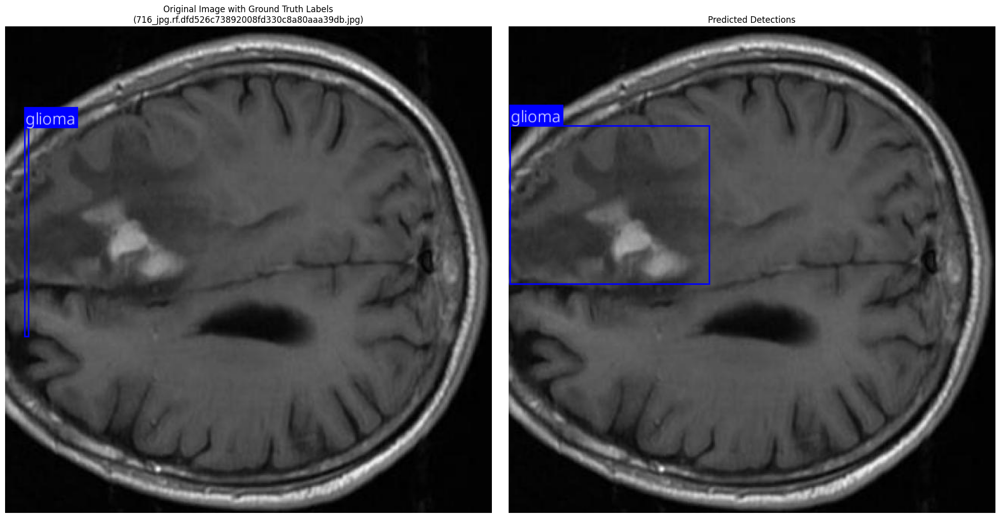


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/238_jpg.rf.65430d94abbce87d2b08f7ea39476912.jpg: 640x640 1 meningioma, 8.8ms
Speed: 1.1ms preprocess, 8.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


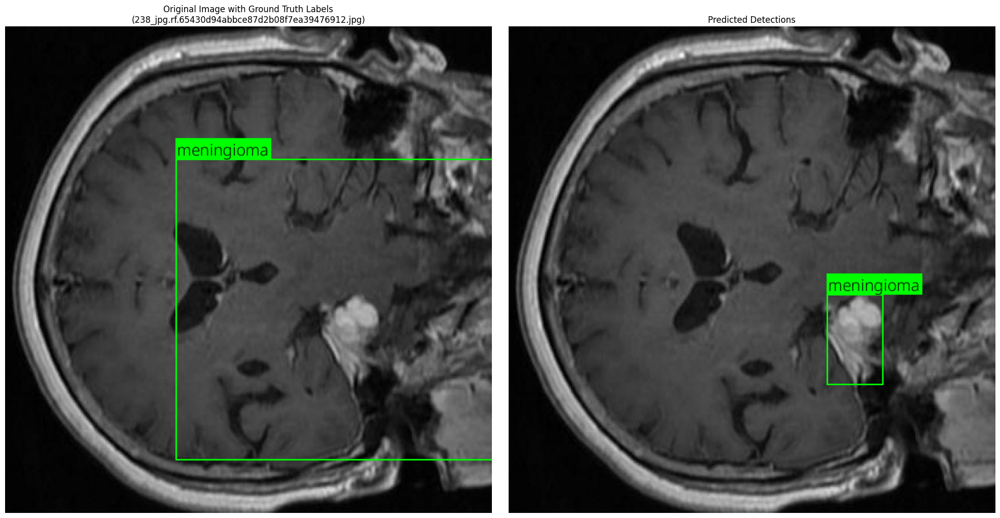


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/567_jpg.rf.d73c7f303d552e7bd554da617ebdf9e8.jpg: 640x640 2 meningiomas, 10.3ms
Speed: 1.1ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


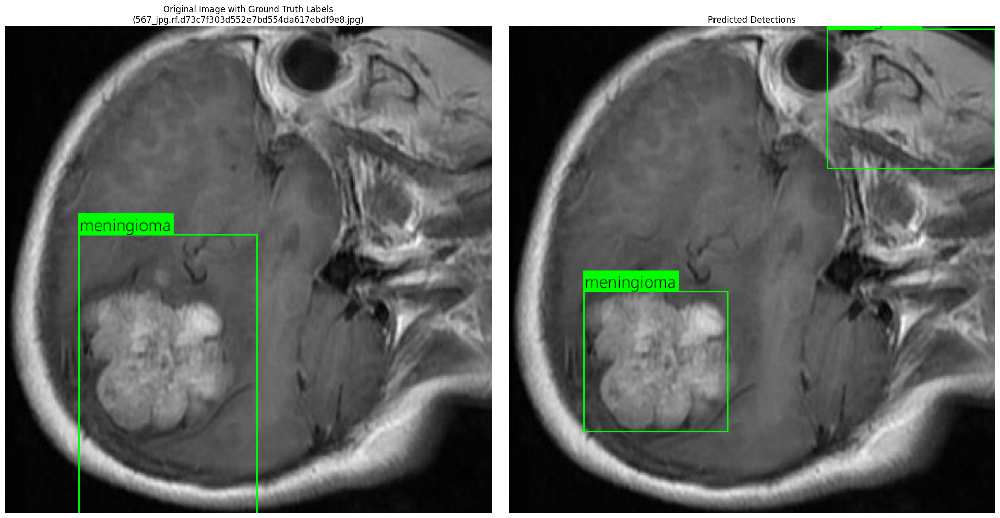


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2548_jpg.rf.ac53adca8ccdd9528c674565e3fc089f.jpg: 640x640 1 glioma, 9.1ms
Speed: 1.1ms preprocess, 9.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


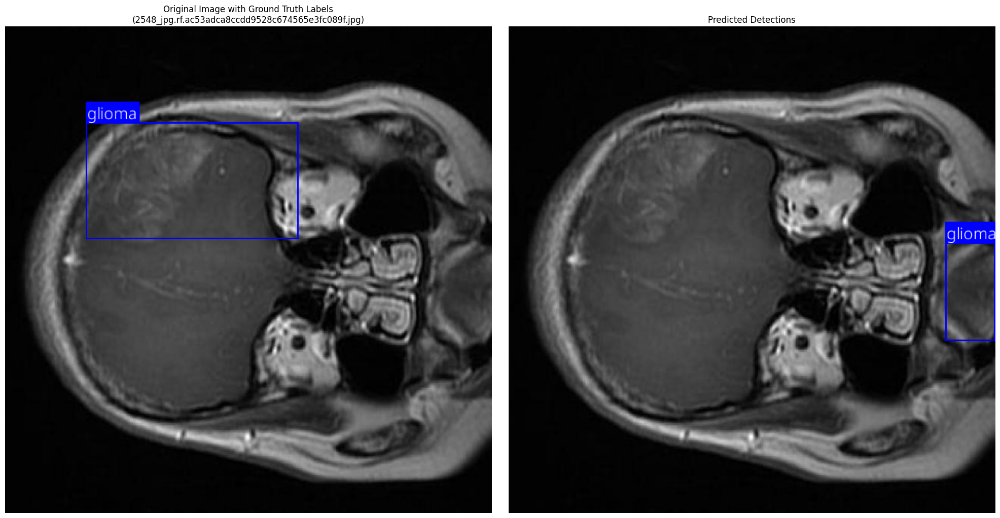


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1764_jpg.rf.84eba4eb8f41b13c10ae320dc7b16dcc.jpg: 640x640 1 glioma, 10.2ms
Speed: 1.0ms preprocess, 10.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


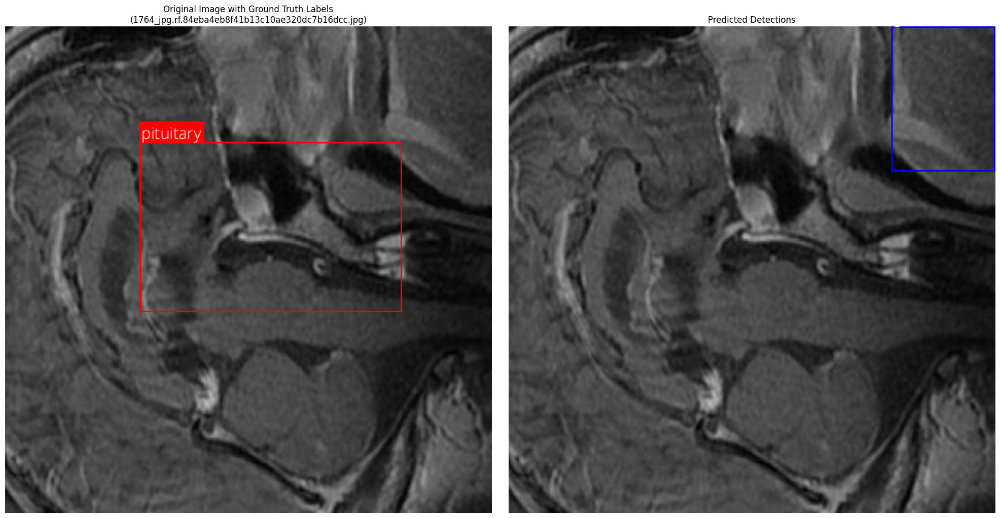


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2815_jpg.rf.81624e0074c19dd034b6ef6e5ffe98cd.jpg: 640x640 2 gliomas, 8.9ms
Speed: 1.1ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


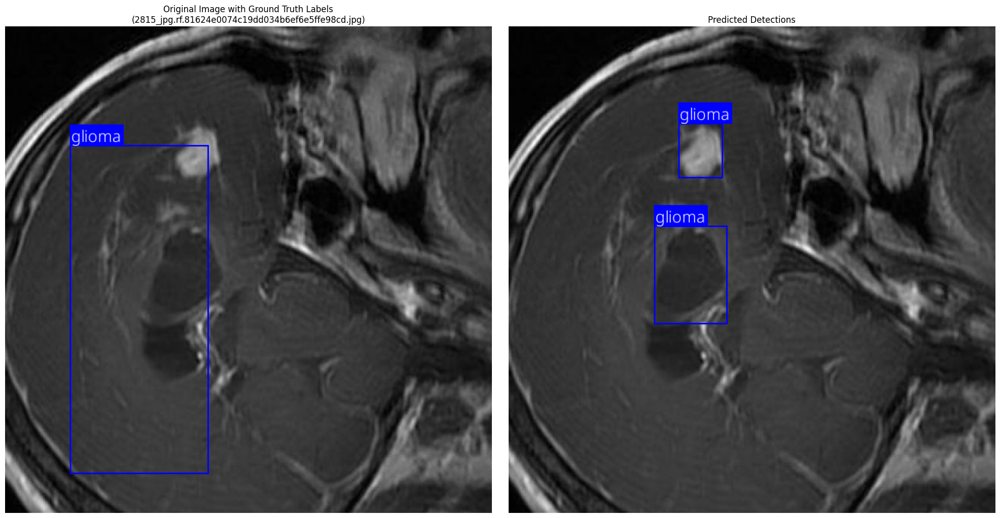


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1629_jpg.rf.d5cb6536907fd787343060675defad02.jpg: 640x640 1 pituitary, 10.6ms
Speed: 1.7ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


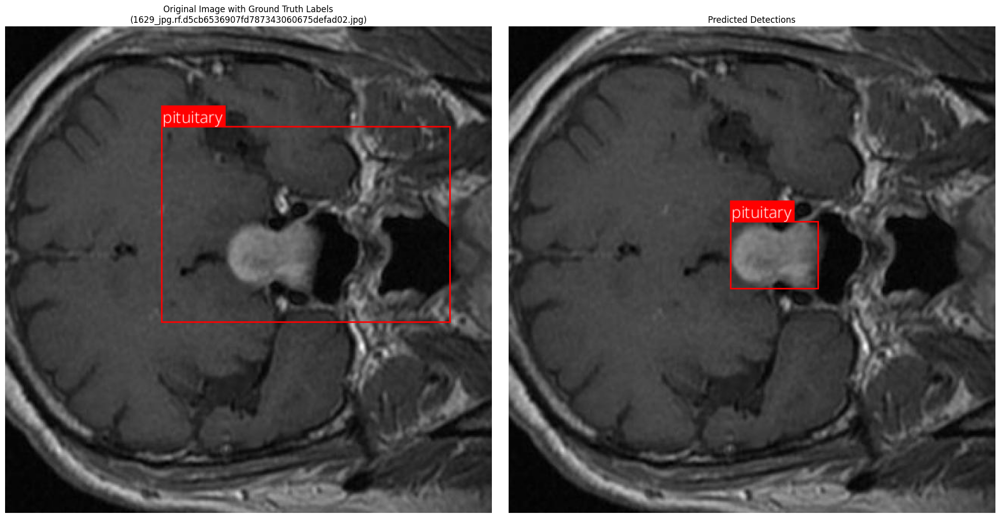


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2231_jpg.rf.3896d9a386f787ad08f5afc80b480603.jpg: 640x640 1 glioma, 9.1ms
Speed: 1.1ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


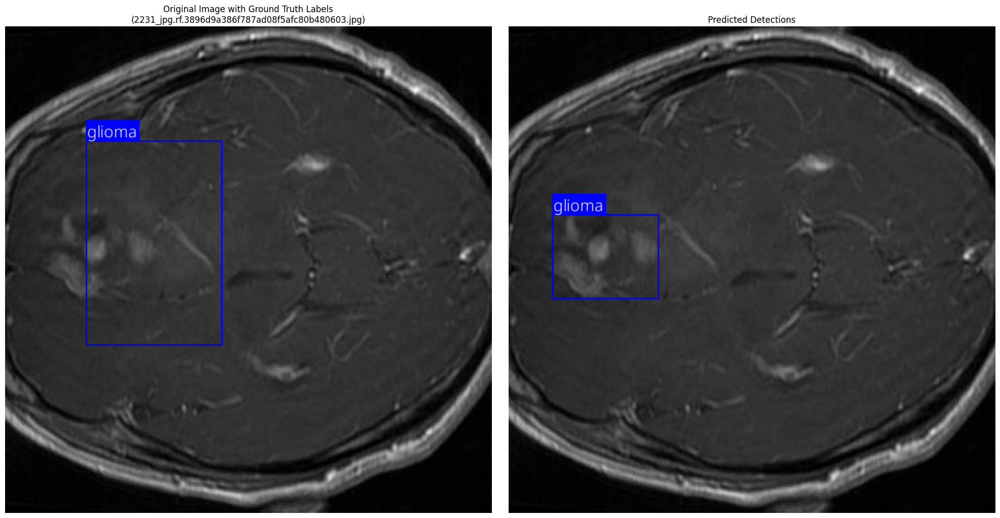


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/917_jpg.rf.7568a738ce7a4b465334c64cf3abb21d.jpg: 640x640 1 glioma, 10.9ms
Speed: 1.1ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


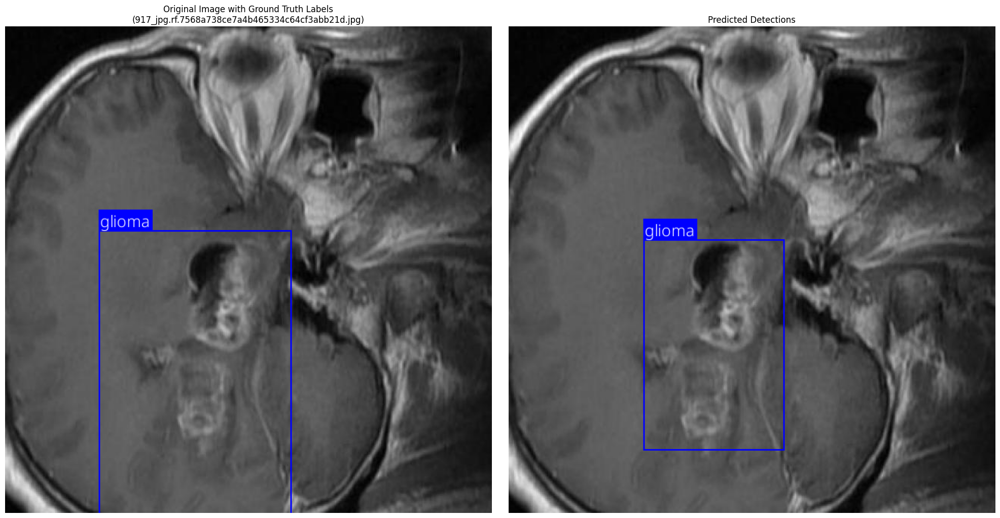


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1311_jpg.rf.3c072180d36416037748e0147ee0ad2a.jpg: 640x640 1 pituitary, 9.6ms
Speed: 1.1ms preprocess, 9.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


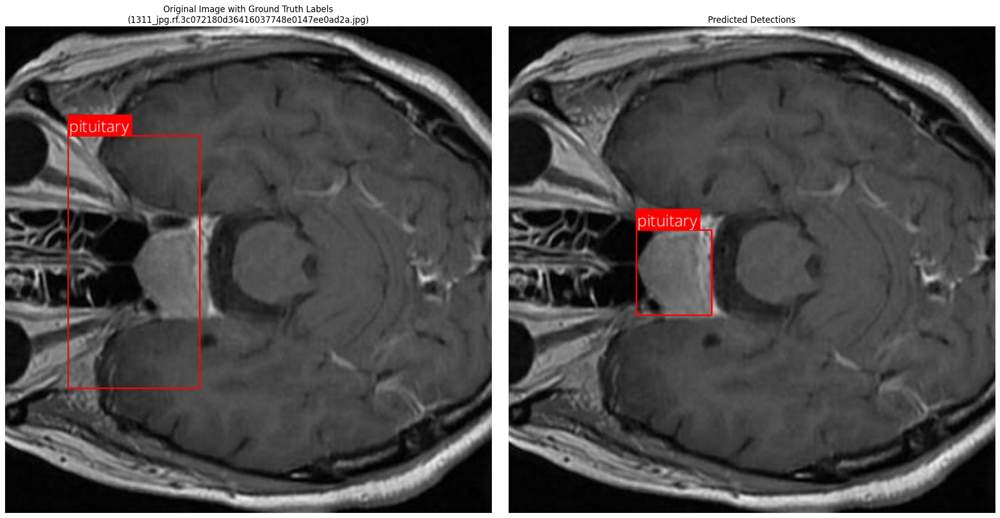


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/964_jpg.rf.7ce0bb422c279b80d38fbe1b4d46dabf.jpg: 640x640 1 pituitary, 10.3ms
Speed: 1.1ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


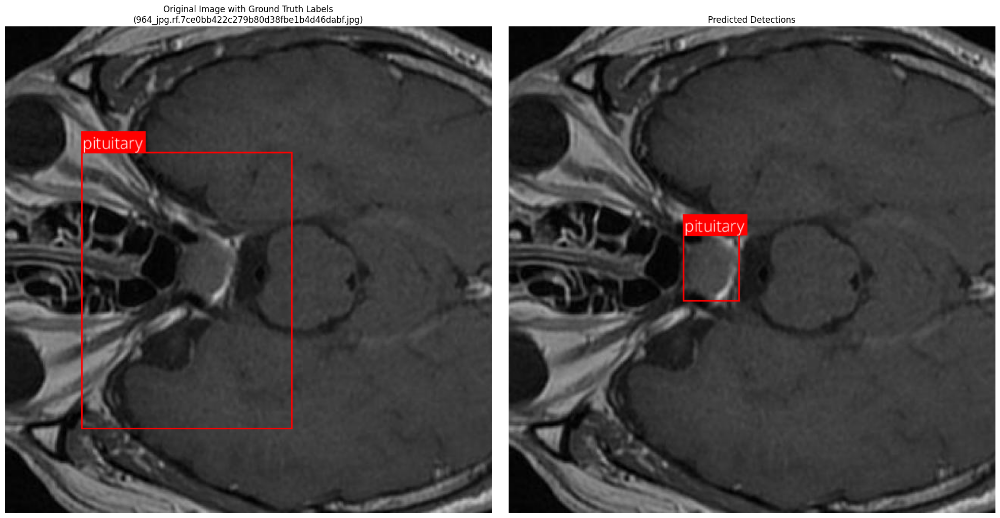


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/2009_jpg.rf.bc09ea2f70c2daed3f2fe5f785bd1a58.jpg: 640x640 1 glioma, 9.0ms
Speed: 1.1ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


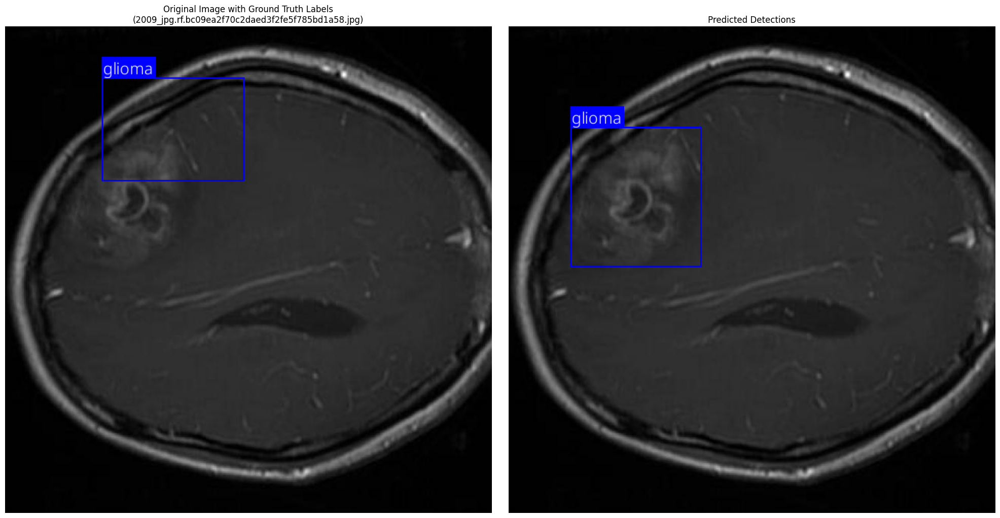


image 1/1 /mnt/Common/Code/Model Training/Afiya/Brain Tumor Detection/dataset/test/images/1845_jpg.rf.0f696dec899f9e3d0ee3cccaf1880c99.jpg: 640x640 2 gliomas, 10.7ms
Speed: 1.4ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


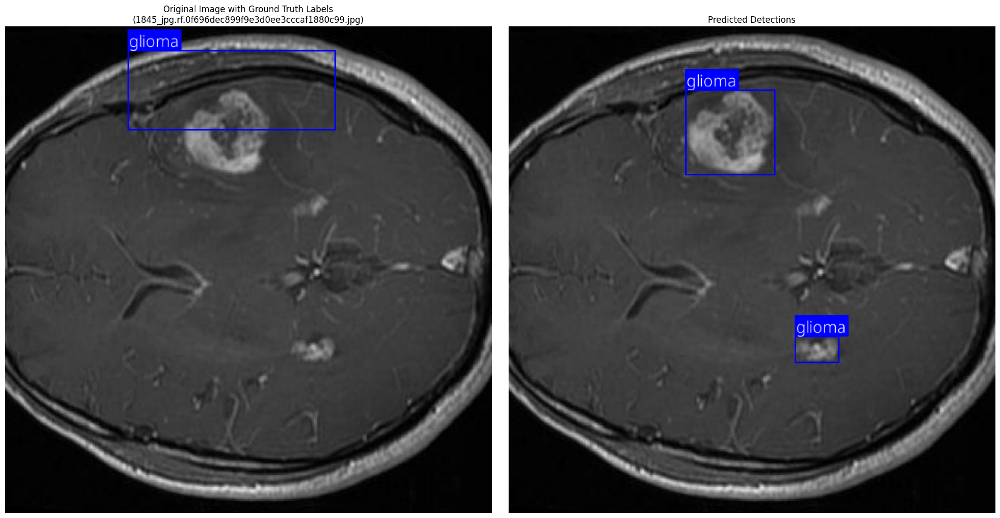

In [12]:
%matplotlib inline
for img_path in test_image_files:
    img_filename = os.path.basename(img_path)
    img_name_no_ext = os.path.splitext(img_filename)[0]
    label_path = os.path.join(TEST_LABELS_DIR, img_name_no_ext + '.txt')

    original_image = cv2.imread(img_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    ground_truth_annotations = []


    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                ground_truth_annotations.append(parts)

                cls_id, x_center, y_center, width, height = parts[:5]
                cls_id = int(cls_id)

        
    ground_truth_image_display = draw_annotations(original_image.copy(), ground_truth_annotations, class_names, is_gt=True)

    prediction_results = trained_model.predict(
        source=img_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        # iou=IOU_THRESHOLD,
        # save=True,  # No longer saving predicted images
        # save_txt=True, # No longer saving predicted labels to file
        project=PREDICT_PROJECT_NAME,
        name=PREDICT_RUN_NAME,
        exist_ok=True,
        line_width=1,
        show_conf=False,
    )

    # Extract predicted annotations from the results
    predicted_annotations = []

    if prediction_results and len(prediction_results) > 0:
        # Assuming single image prediction, take the first result
        res = prediction_results[0]
        if res.boxes:
            for *xywh, conf, cls_id in res.boxes.data.tolist():
                # Convert xyxy (from res.boxes.data) to normalized xywh for draw_annotations
                # YOLO output is typically x_min, y_min, x_max, y_max (xyxy)
                # We need x_center, y_center, width, height (normalized)
                img_h, img_w, _ = original_image.shape
                x_min, y_min, x_max, y_max = xywh
                
                # Convert to normalized (0-1) coordinates
                x_center = ((x_min + x_max) / 2) / img_w
                y_center = ((y_min + y_max) / 2) / img_h
                width = (x_max - x_min) / img_w
                height = (y_max - y_min) / img_h
                cls_id = int(cls_id)

                predicted_annotations.append([int(cls_id), x_center, y_center, width, height, conf])
                
                
    predicted_image_display = draw_annotations(original_image.copy(), predicted_annotations, class_names, is_gt=False) # Red for predictions

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(ground_truth_image_display)
    axes[0].set_title(f'Original Image with Ground Truth Labels\n({img_filename})')
    axes[0].axis('off')

    axes[1].imshow(predicted_image_display)
    axes[1].set_title(f'Predicted Detections')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()